In [2]:
import pandas as pd

# Load the original DataFrame
filename = 'data/final_df.csv'
modified_final_df = pd.read_csv(filename, sep=',')

# Fill NaN values with the median for specified columns
for column in ['Dew Point Temperature_P39', 'Relative Humidity_P6', 'Wind Speed_P4']:
    modified_final_df[column] = modified_final_df[column].fillna(modified_final_df[column].median())


# Save the modified DataFrame to a new CSV file
modified_filename = 'data/modified_final_df.csv'
modified_final_df.to_csv(modified_filename, index=True)

In [1]:

import pandas as pd
filename = 'data/modified_final_df.csv'
modified_final_df = pd.read_csv(filename, sep=',')

# Now we have a dataframe (modified_final_df) which is exactly the same as final_df but the three weather features of it has imputed the Nans with median (median of the coulmn). The CSV file of this modified dataframe is modified_final_df.csv

In [3]:
# You can see 
modified_final_df

,DateTime,CUSTOMER,AREA,ISPRIVATEPERSON,Power_Consumption,One_Day_Power,One_Day_Power_NaN,Air Temperature 1 Min_P19,Air Temperature 2 Max_P27,Air Temperature 2 Min_P26,Dew Point Temperature_P39,Precipitation_P7,Relative Humidity_P6,Wind Speed_P4,Price
0,2020-01-01 00:00:00,1060598736,Kvarnholmen,Nej,0.011200,0.260400,0,NaN,NaN,NaN,-2.4,NaN,80.0,5.0,28.45
1,2020-01-01 00:00:00,1060753918,Malmen,Nej,0.001797,0.054926,0,NaN,NaN,NaN,-2.4,NaN,80.0,5.0,28.45
2,2020-01-01 00:00:00,1060753924,Malmen,Nej,0.021600,0.564000,0,NaN,NaN,NaN,-2.4,NaN,80.0,5.0,28.45
3,2020-01-01 00:00:00,1060753932,Malmen,Nej,0.004122,0.107658,0,NaN,NaN,NaN,-2.4,NaN,80.0,5.0,28.45
4,2020-01-01 00:00:00,1060753945,Malmen,Nej,0.001120,0.027033,0,NaN,NaN,NaN,-2.4,NaN,80.0,5.0,28.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91068427,2023-12-31 23:00:00,1060619147,Malmen,Ja,0.000101,0.003008,0,NaN,NaN,NaN,4.8,NaN,88.0,3.0,29.56
91068428,2023-12-31 23:00:00,1060619139,Malmen,Nej,0.000028,0.000687,0,NaN,NaN,NaN,4.8,NaN,88.0,3.0,29.56
91068429,2023-12-31 23:00:00,1060619133,Malmen,Ja,0.000071,0.004211,0,NaN,NaN,NaN,4.8,NaN,88.0,3.0,29.56
91068430,2023-12-31 23:00:00,1060619347,Malmen,Ja,0.000376,0.017268,0,NaN,NaN,NaN,4.8,NaN,88.0,3.0,29.56


# We need to add: hour of the day, day of the week, month, season, and time of day, which could have predictive capabality.

In [3]:
import pandas as pd

modified_final_df['DateTime'] = pd.to_datetime(modified_final_df['DateTime'])

# Extract features from DateTime
modified_final_df['Hour'] = modified_final_df['DateTime'].dt.hour   # Power consumption patterns may vary throughout the day.
modified_final_df['DayOfWeek'] = modified_final_df['DateTime'].dt.dayofweek #Weekday vs. weekend consumption patterns could differ.
modified_final_df['Month'] = modified_final_df['DateTime'].dt.month #Seasonal trends can affect power usage due to heating in winter or cooling in summer, for instance.
modified_final_df['Year'] = modified_final_df['DateTime'].dt.year #If you have several years of data, there could be long-term trends in power consumption.
modified_final_df['WeekOfYear'] = modified_final_df['DateTime'].dt.isocalendar().week #To capture seasonal effects that are more granular than months.
modified_final_df['DayOfYear'] = modified_final_df['DateTime'].dt.dayofyear #To capture the progression of seasons.
#'ISPRIVATEPERSON' is the column with categorical values.
modified_final_df['ISPRIVATEPERSON'] = modified_final_df['ISPRIVATEPERSON'].map({'Ja': 1, 'Nej': 0})

In [4]:
modified_final_df['Month']

0            1
1            1
2            1
3            1
4            1
            ..
91068427    12
91068428    12
91068429    12
91068430    12
91068431    12
Name: Month, Length: 91068432, dtype: int32

In [5]:
modified_final_df['ISPRIVATEPERSON']

0           0
1           0
2           0
3           0
4           0
           ..
91068427    1
91068428    0
91068429    1
91068430    1
91068431    0
Name: ISPRIVATEPERSON, Length: 91068432, dtype: int64

# transformed_df will be the dataframe that data scaling and PCA are applied on that and has three columns PC1, PC2, and PC3

In [6]:
from sklearn.decomposition import IncrementalPCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# Initialize the scaler and PCA
scaler = StandardScaler()
pca = IncrementalPCA(n_components=3)

# Define the columns you want to use for PCA, excluding 'ISPRIVATEPERSON'
columns_for_pca = ['Power_Consumption', 'Dew Point Temperature_P39', 'Relative Humidity_P6', 'Wind Speed_P4', 'Price']

# Function to subset the data by time period and perform PCA
def subset_and_pca(df, time_col, time_value):
    subset_df = df[df[time_col] == time_value]
    data_for_pca = subset_df[columns_for_pca]

    # Scale the data
    scaled_data = scaler.fit_transform(data_for_pca)

    # Fit and transform with PCA
    transformed_data = pca.fit_transform(scaled_data)

    # Convert transformed data into a DataFrame
    transformed_df = pd.DataFrame(transformed_data, columns=['PC1', 'PC2', 'PC3'])
    transformed_df['ISPRIVATEPERSON'] = subset_df['ISPRIVATEPERSON'].values
    
    # Get the PCA components (loadings)
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

    # Create a DataFrame for the loadings
    loading_matrix = pd.DataFrame(loadings, index=columns_for_pca, columns=['PC1', 'PC2', 'PC3'])

    return transformed_df, loading_matrix

month_to_season = {
    1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall',
    11: 'Fall', 12: 'Winter'
}
modified_final_df['Season'] = modified_final_df['Month'].map(month_to_season)

# Define time periods for analysis, for example, months or seasons
# Assuming you have a 'Season' column, if not, you have to create it based on the 'Month' column
time_periods = {
    'Month': modified_final_df['Month'].unique(),
    'Season': modified_final_df['Season'].unique(), 
}

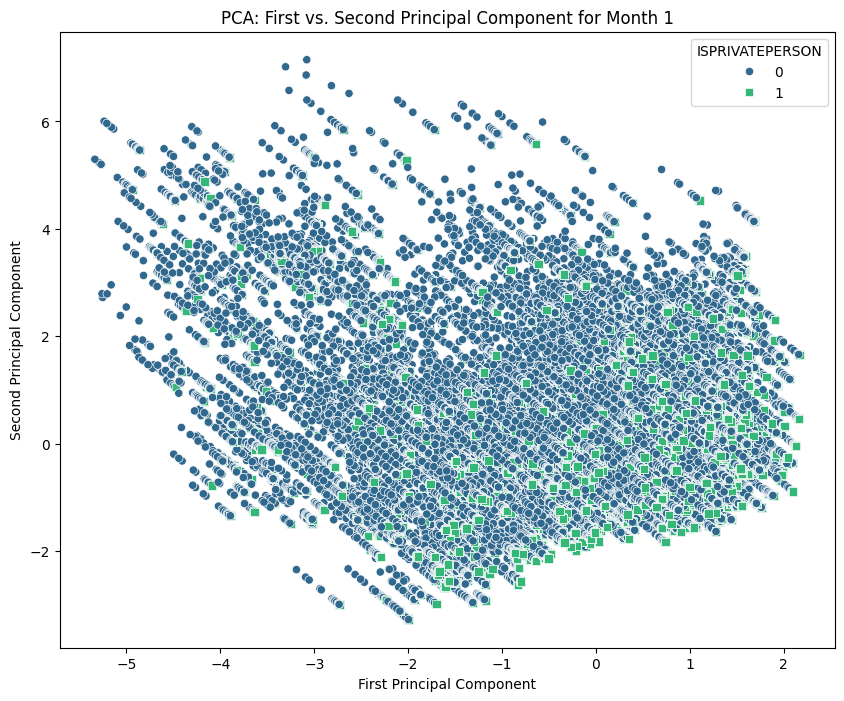

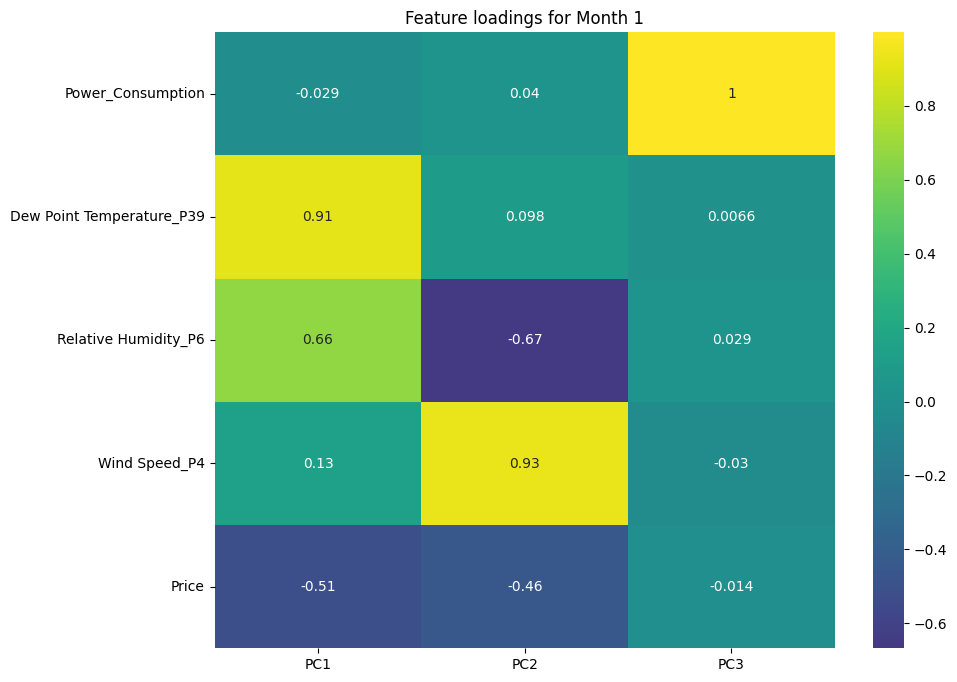

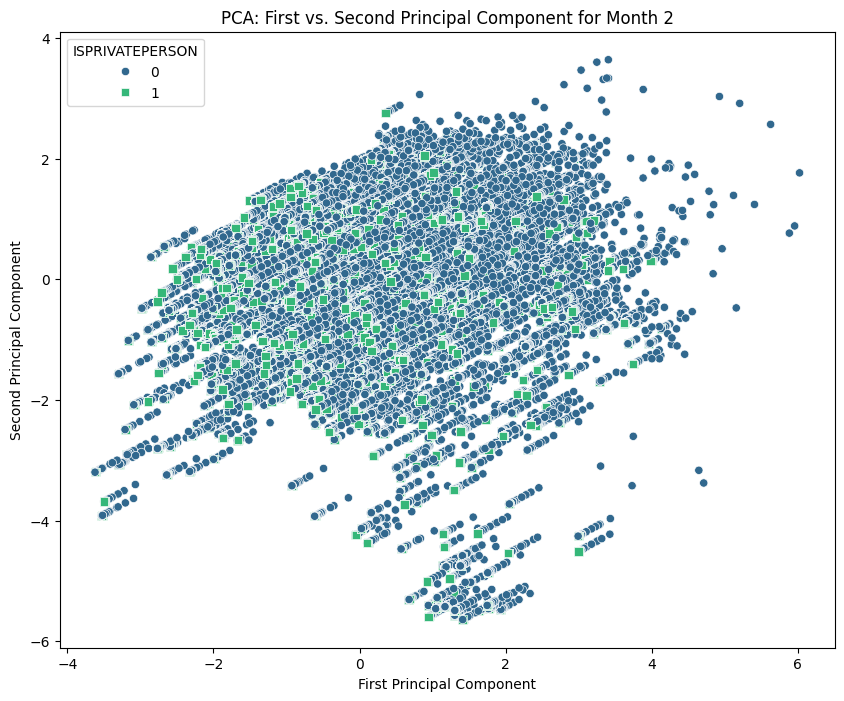

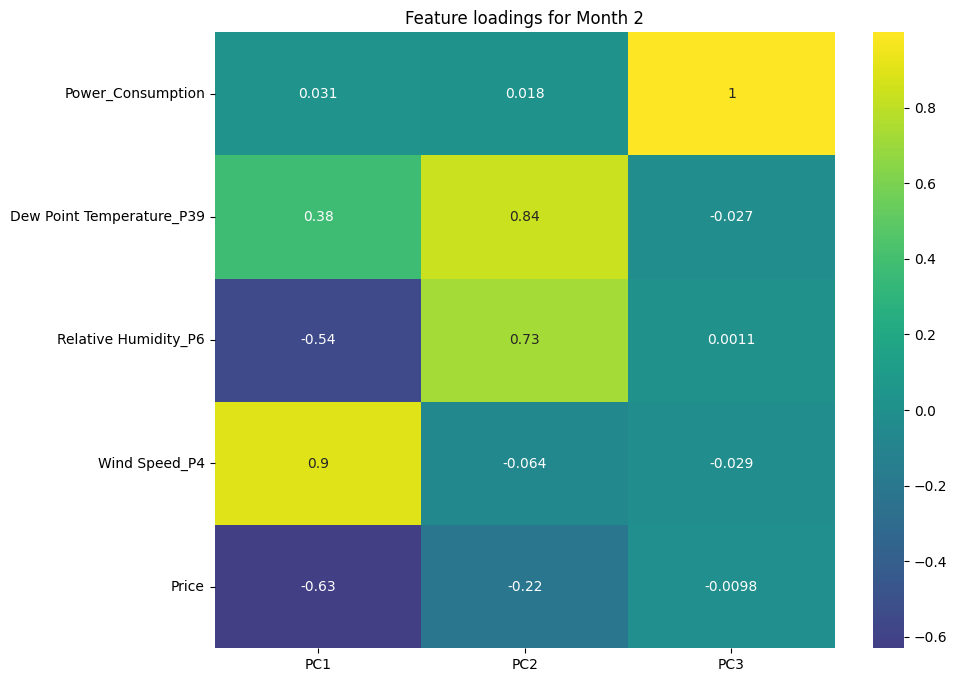

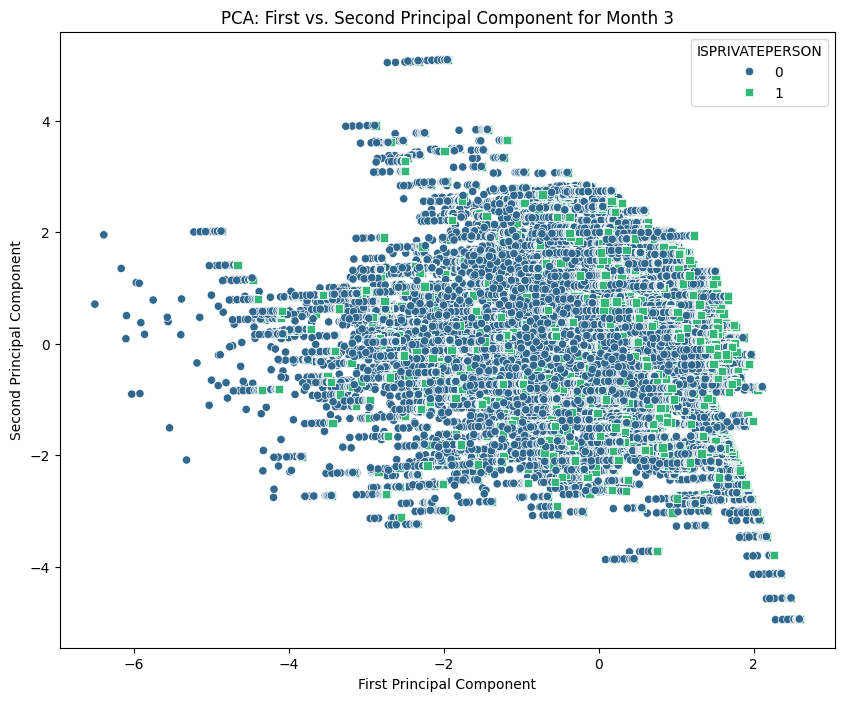

...

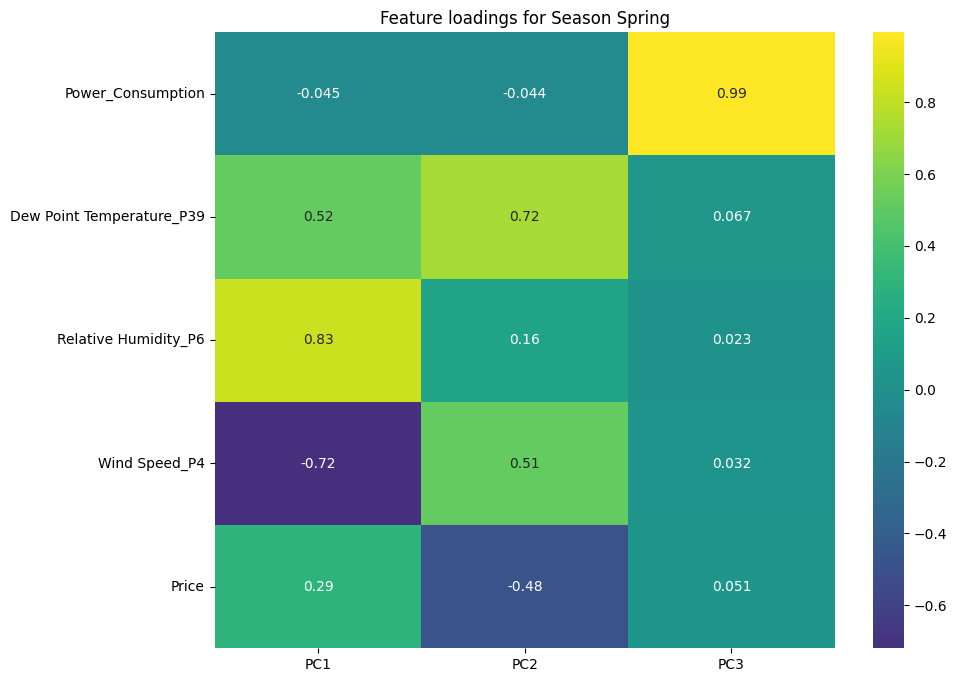

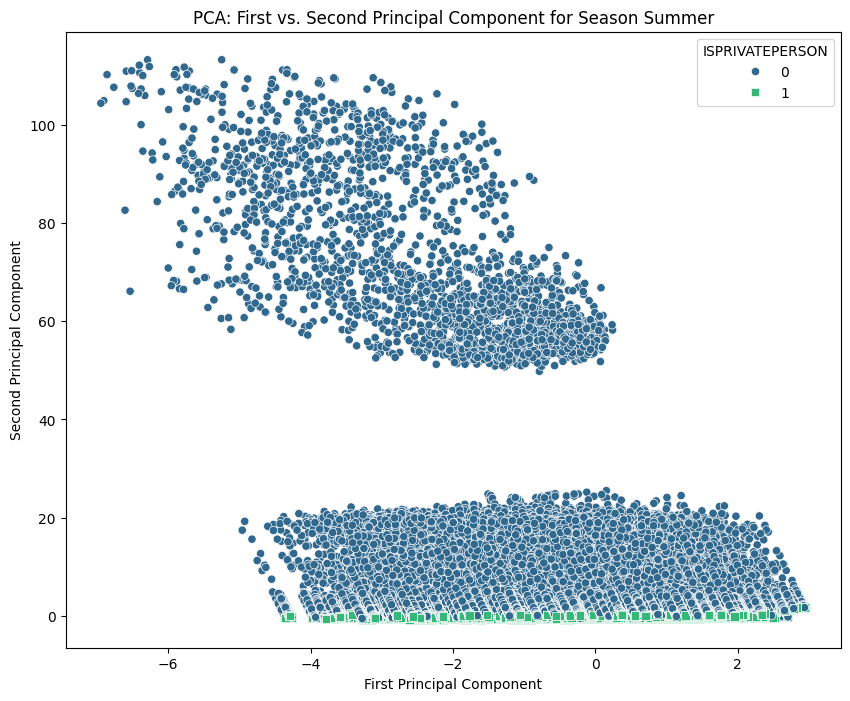

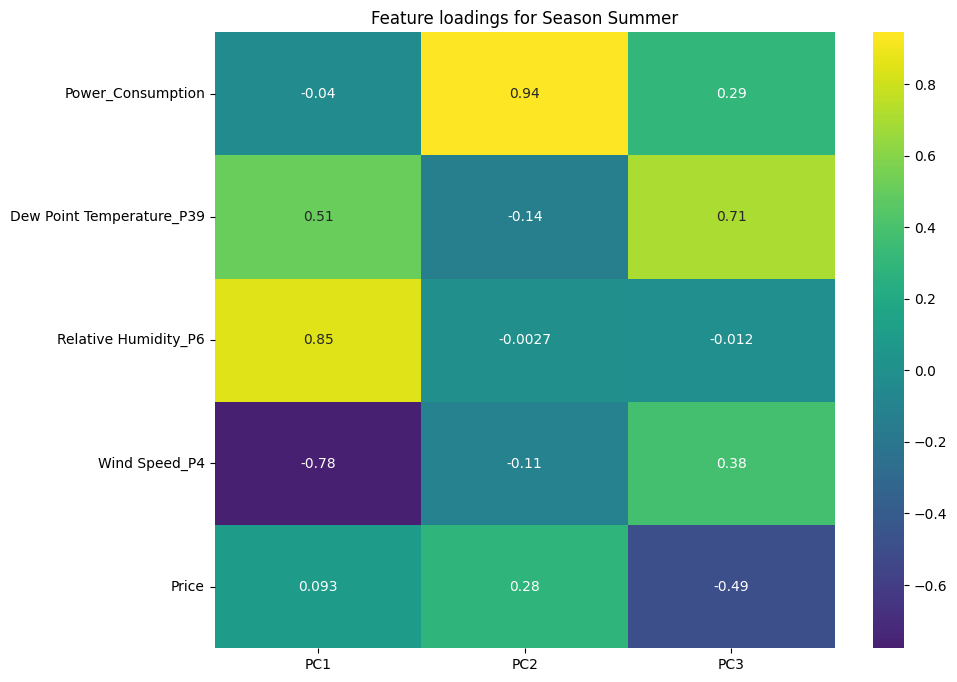

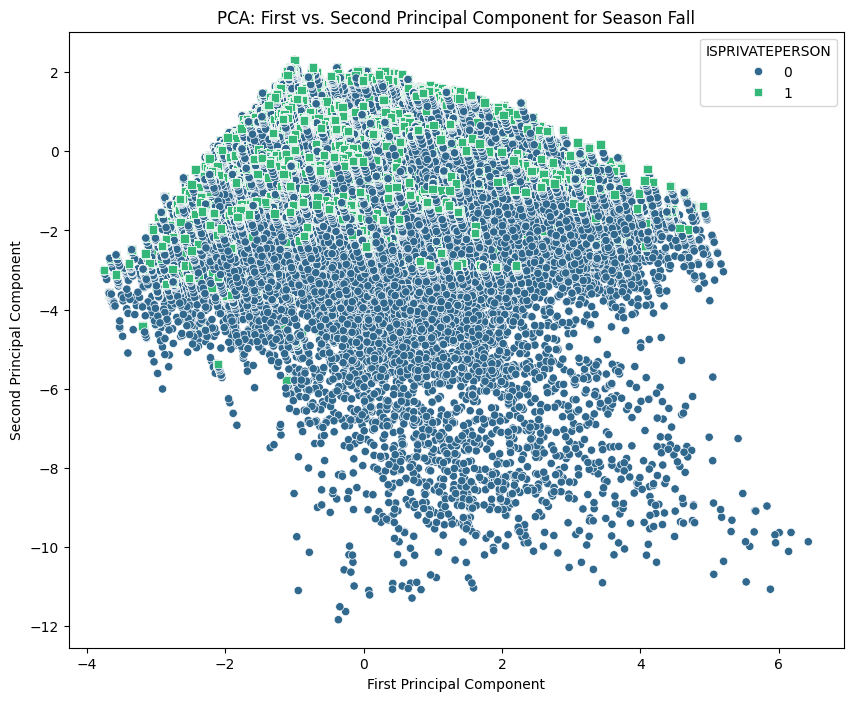

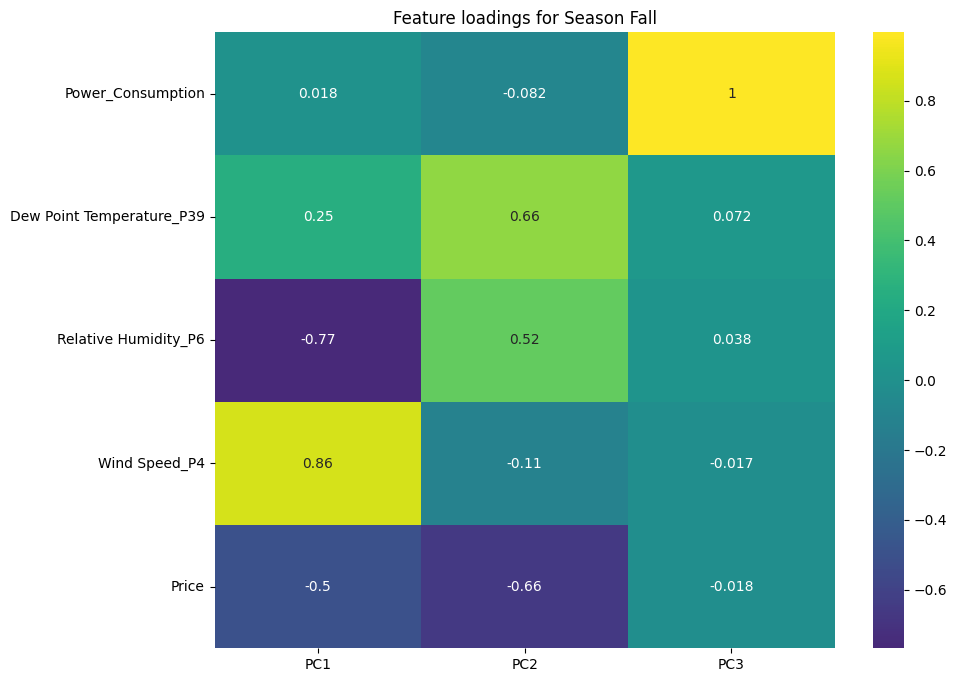

In [7]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Function to save the loading matrix as a CSV and plot a heatmap
def save_and_plot_loadings(loading_matrix, time_col, value):
    # Save the loading matrix as a CSV file
    loading_matrix.to_csv(f'figures/loadings_{time_col}_{value}.csv')
    
    # Plot a heatmap for the loading matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(loading_matrix, annot=True, cmap='viridis', center=0)
    plt.title(f'Feature loadings for {time_col} {value}')
    plt.savefig(f'figures/loadings_heatmap_{time_col}_{value}.png')
    plt.show()
    
# Iterate over each time period and plot PCA results
for time_col, values in time_periods.items():
    for value in values:
        pca_df, loading_matrix  = subset_and_pca(modified_final_df, time_col, value)
        
        # Plot PCA
        plt.figure(figsize=(10, 8))
        sns.scatterplot(
            data=pca_df, 
            x='PC1', 
            y='PC2', 
            hue='ISPRIVATEPERSON', 
            palette='viridis', 
            style='ISPRIVATEPERSON', 
            markers=['o', 's']
        )
        plt.title(f'PCA: First vs. Second Principal Component for {time_col} {value}')
        plt.xlabel('First Principal Component')
        plt.ylabel('Second Principal Component')
        plt.legend(title='ISPRIVATEPERSON')
        plt.savefig(f'figures/PCA_{time_col}_{value}.pdf')
        plt.savefig(f'figures/PCA_{time_col}_{value}.png')
        plt.show()
        
        # Save and plot the loading matrix
        save_and_plot_loadings(loading_matrix, time_col, value)


# Plot all PCs

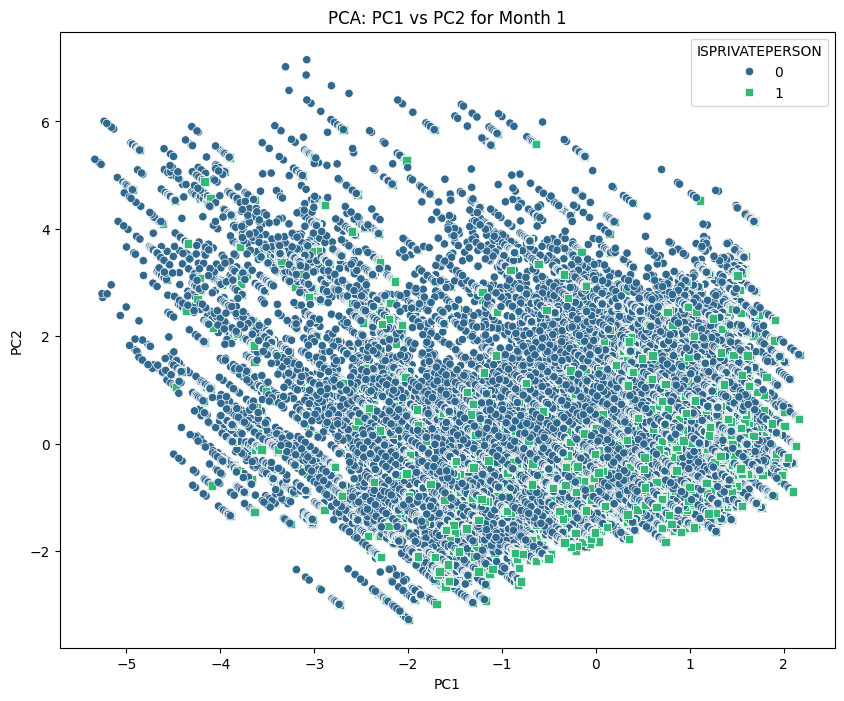

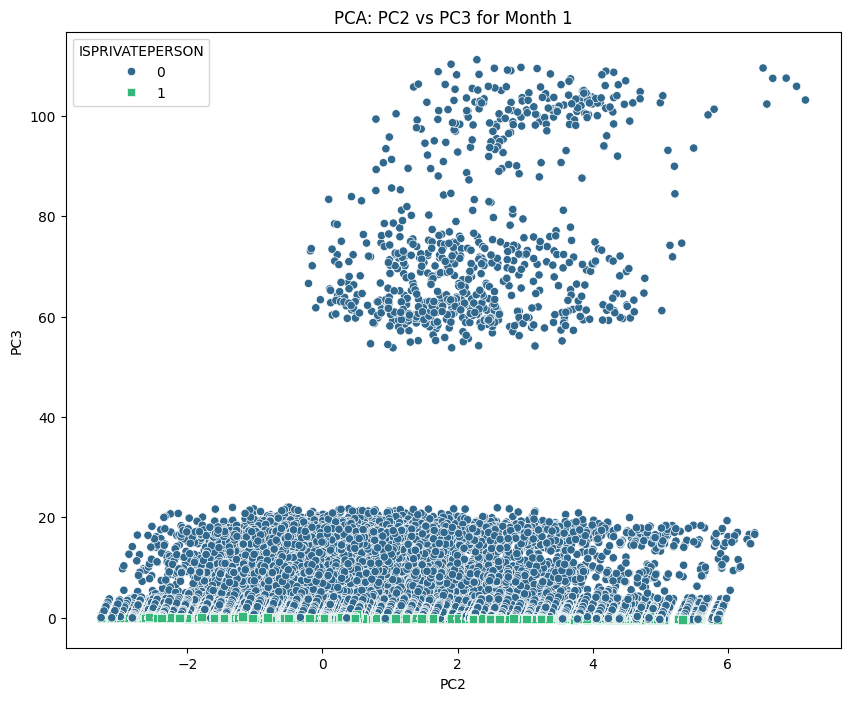

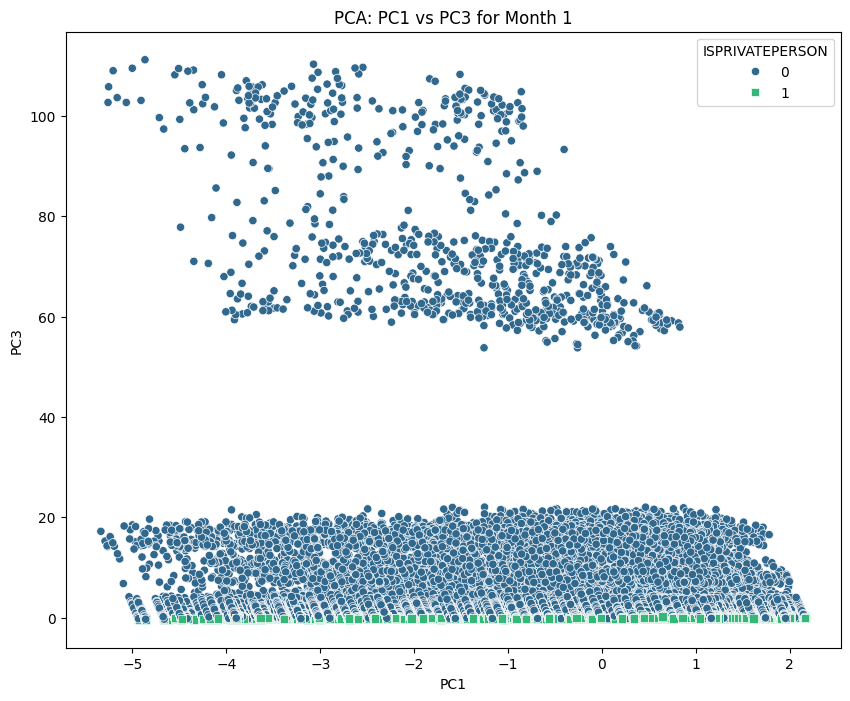

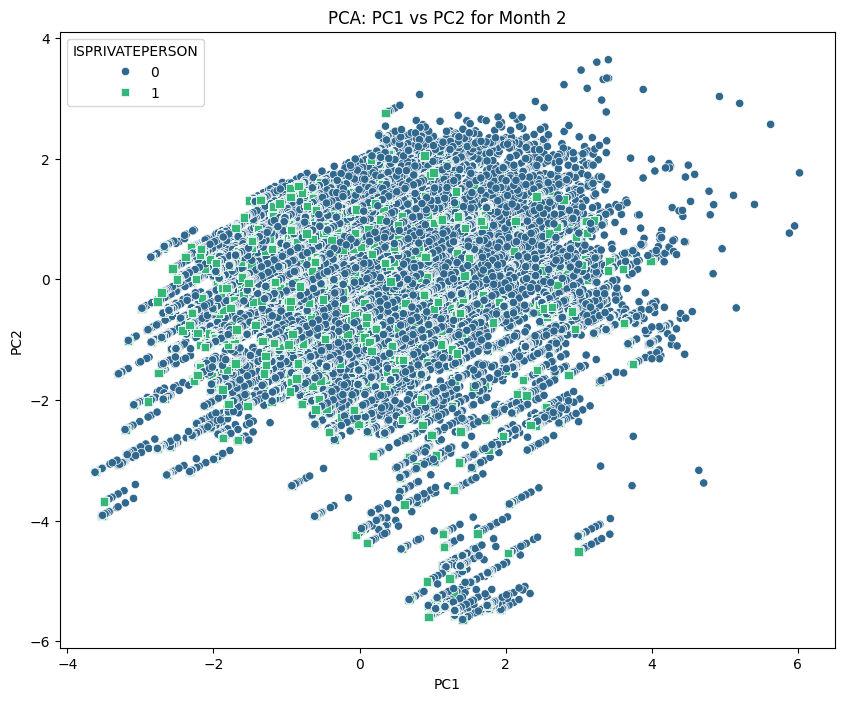

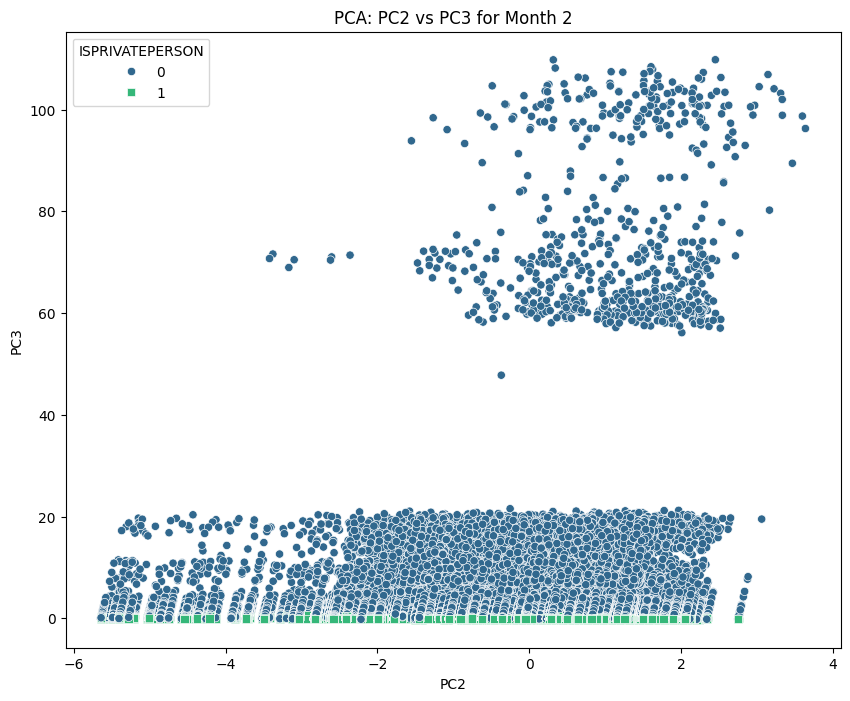

...

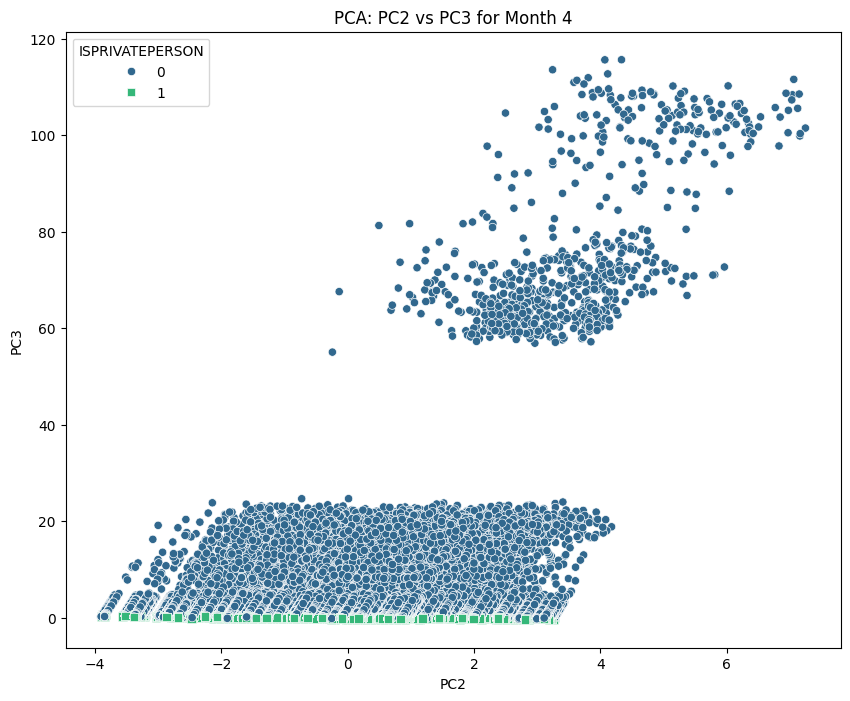

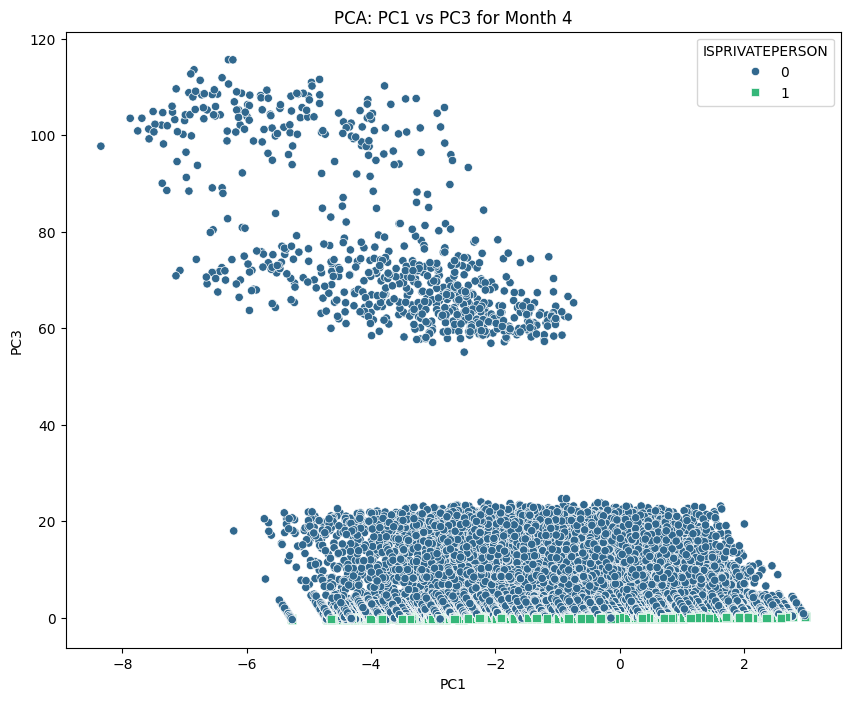

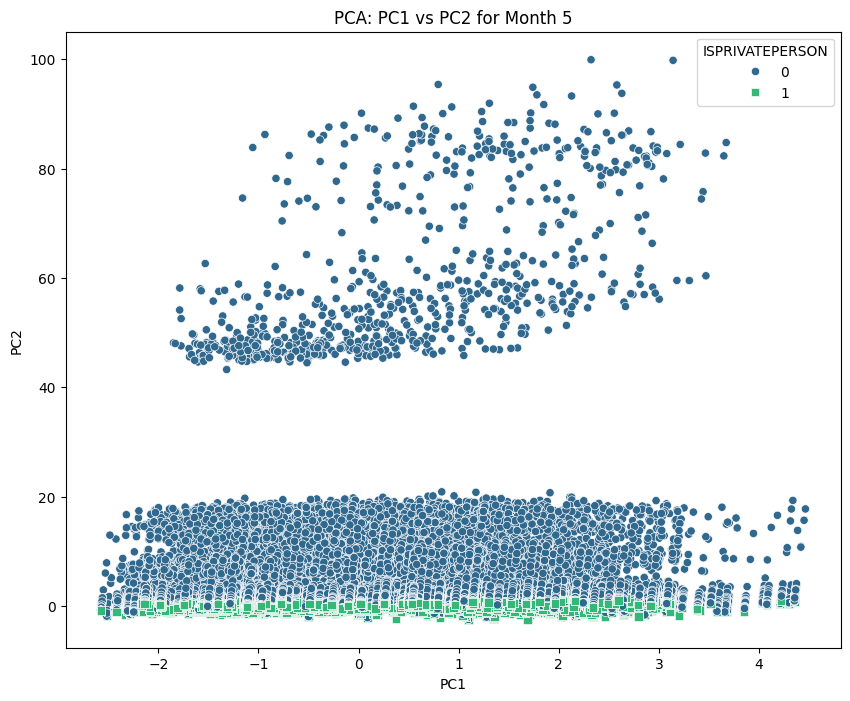

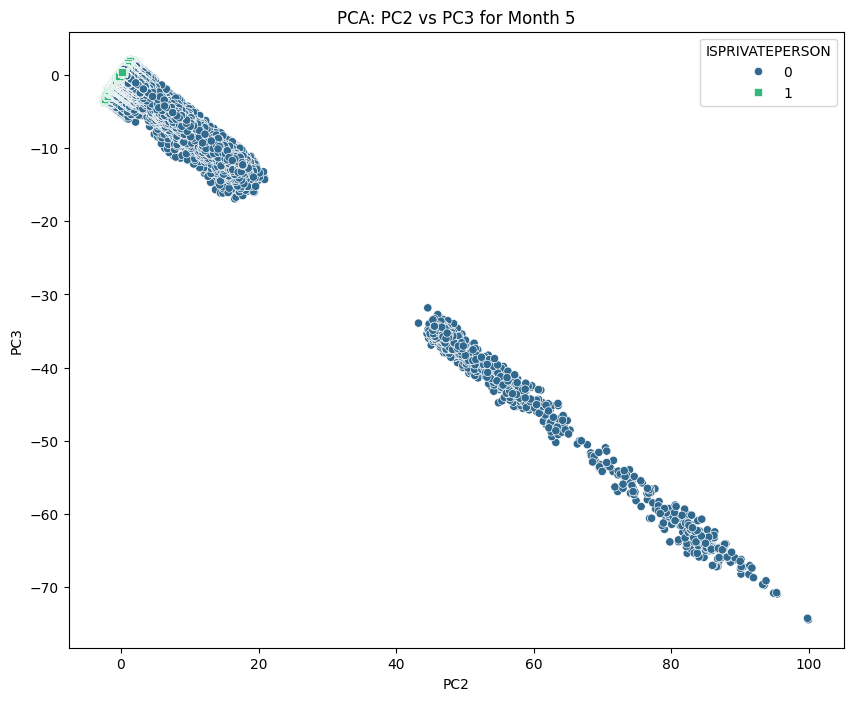

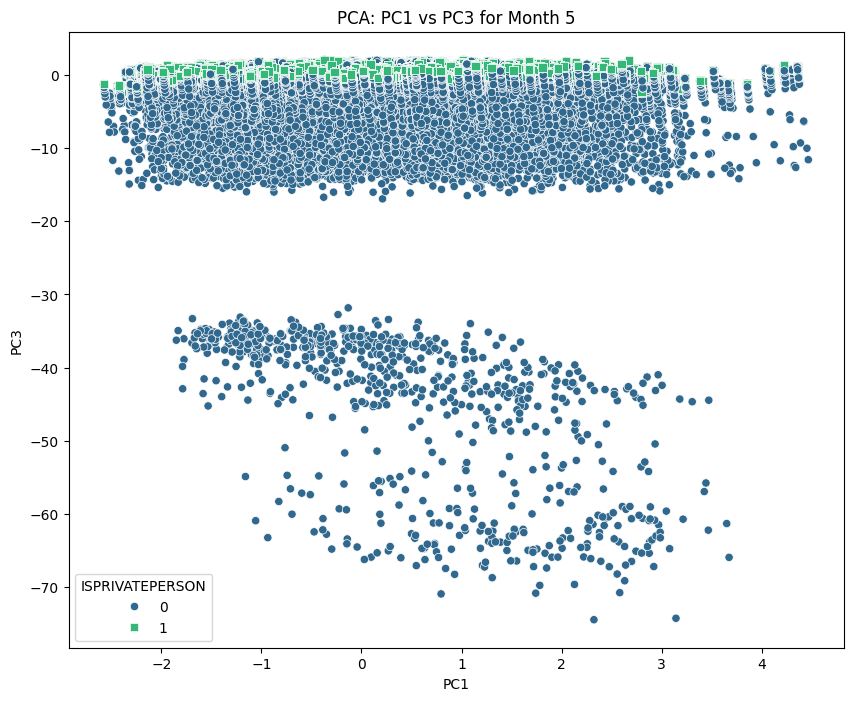

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x176a2f100> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [9]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Define a function to create scatter plots for PCA components
def plot_pca_combinations(pca_df, time_col, value):
    combinations = [('PC1', 'PC2'), ('PC2', 'PC3'), ('PC1', 'PC3')]
    for i, (pcx, pcy) in enumerate(combinations):
        plt.figure(figsize=(10, 8))
        sns.scatterplot(
            data=pca_df,
            x=pcx,
            y=pcy,
            hue='ISPRIVATEPERSON',
            palette='viridis',
            style='ISPRIVATEPERSON',
            markers=['o', 's']
        )
        plt.title(f'PCA: {pcx} vs {pcy} for {time_col} {value}')
        plt.xlabel(pcx)
        plt.ylabel(pcy)
        plt.legend(title='ISPRIVATEPERSON')
        plt.savefig(f'figures/PCA_{pcx}_{pcy}_{time_col}_{value}.pdf')
        plt.savefig(f'figures/PCA_{pcx}_{pcy}_{time_col}_{value}.png')
        plt.show()

# Iterate over each time period and plot PCA results
for time_col, values in time_periods.items():
    for value in values:
        pca_df = subset_and_pca(modified_final_df, time_col, value)
        plot_pca_combinations(pca_df, time_col, value)